# Monocular depth estimation

## Introduction

Depth estimation is a crucial step towards inferring scene geometry from 2D images. The goal in monocular depth estimation is to predict the depth value of each pixel or inferring depth information, given only a single RGB image as input. This example will show an approach to build a depth estimation model with a convnet and simple loss functions.

<img src='https://paperswithcode.com/media/thumbnails/task/task-0000000605-d9849a91.jpg' width='500'> 

## Setup

- torchgeometry : geometric computer vision library

[torchgeometry Docs](https://kornia.readthedocs.io/en/v0.1.2/)

In [1]:
import os
import sys

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
from torchinfo import summary
from torchgeometry.losses import depth_smooth, ssim
from einops import rearrange

import pandas as pd
import numpy as np
import cv2
import copy
import matplotlib.pyplot as plt
%matplotlib notebook

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True

In [3]:
torchvision.__version__

'0.9.0+cu111'

## Downloading the dataset

We will be using the dataset DIODE: A Dense Indoor and Outdoor Depth Dataset for this tutorial. However, we use the validation set generating training and evaluation subsets for our model. The reason we use the validation set rather than the training set of the original dataset is because the training set consists of 81GB of data, which is challenging to download compared to the validation set which is only 2.6GB. Other datasets that you could use are NYU-v2 and KITTI.

In [4]:
from urllib import request
import tarfile

annotation_folder = os.path.abspath(".") + "/dataset/"
url = "http://diode-dataset.s3.amazonaws.com/val.tar.gz"
savefile = os.path.join(annotation_folder, "val.tar.gz")

if not os.path.exists(annotation_folder):
    os.makedirs(annotation_folder)
    print('Folder creation complete!')
else:
    print('The folder already exists.')

if not os.path.isfile(savefile):
    request.urlretrieve(url, savefile)
    tar = tarfile.open(savefile, "r:gz")
    for tarinfo in tar:
        tar.extract(tarinfo, annotation_folder, "val")
    print('File creation complete!')
else:
    print('The File already exists.')

The folder already exists.
The File already exists.


## Preparing the dataset

We only use the indoor images to train our depth estimation model.

```RGB images (*.png)```: RGB images with a resolution of 1024 × 768.

```Depth maps (*_depth.npy)```: Depth ground truth with the same resolution as the images.

```Depth validity masks (*_depth_mask.npy)```: Binary depth validity masks where 1 indicates valid sensor returns and 0 otherwise.

In [5]:
path = os.path.join(annotation_folder, "val/indoors")

filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {
    "image": [x for x in filelist if x.endswith(".png")],
    "depth": [x for x in filelist if x.endswith("_depth.npy")],
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")],
}
df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=72)

In [6]:
df

,image,depth,mask
242,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...
198,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...
249,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...
264,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...
317,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...
...,...,...,...
207,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...
222,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...
74,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...
46,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...,/tf/dsba/keras2torch/Computer_Vision/KHW/datas...


## Preparing the dataset

In [7]:
HEIGHT = 256
WIDTH = 256
LR = 0.0002
EPOCHS = 30
BATCH_SIZE = 16

## Building a data pipeline

1. The pipeline takes a dataframe containing the path for the RGB images, as well as the depth and depth mask files.
2. It reads and resize the RGB images.
3. It reads the depth and depth mask files, process them to generate the depth map image and resize it.
4. It returns the RGB images and the depth map images for a batch.

In [8]:
preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((HEIGHT, WIDTH)),
])

In [9]:
def load(image_path, depth_map, mask):
    """Load input and target image."""

    min_depth = 0.1
    
    image_ = cv2.imread(image_path)
    image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
    image_ = preprocess(image_)

    depth_map = np.load(depth_map).squeeze()

    mask = np.load(mask)
    mask = mask > 0

    max_depth = min(300, np.percentile(depth_map, 99))
    depth_map = np.clip(depth_map, min_depth, max_depth)
    depth_map = np.log(depth_map, where=mask)

    depth_map = np.ma.masked_where(~mask, depth_map)

    depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
    depth_map = preprocess(depth_map)

    return image_, depth_map

In [10]:
class CustomDataset(Dataset): 
    def __init__(self, data):
        self.data = data

    def __len__(self): 
        return len(self.data)

    def __getitem__(self, index): 
        x, y = load(
            self.data["image"].iloc[index],
            self.data["depth"].iloc[index],
            self.data["mask"].iloc[index],
        )
        return x, y

In [11]:
params = {'batch_size': BATCH_SIZE,
          'shuffle': True,
          'num_workers': 4,
          'pin_memory' : True}


traindataset = CustomDataset(df[:260])
validdataset = CustomDataset(df[260:])
train_loader = DataLoader(dataset=traindataset, **params)
valid_loader = DataLoader(dataset=validdataset, **params)

In [12]:
print(next(iter(train_loader))[0].shape, next(iter(train_loader))[1].shape)

torch.Size([16, 3, 256, 256]) torch.Size([16, 1, 256, 256])


## Visualizing samples

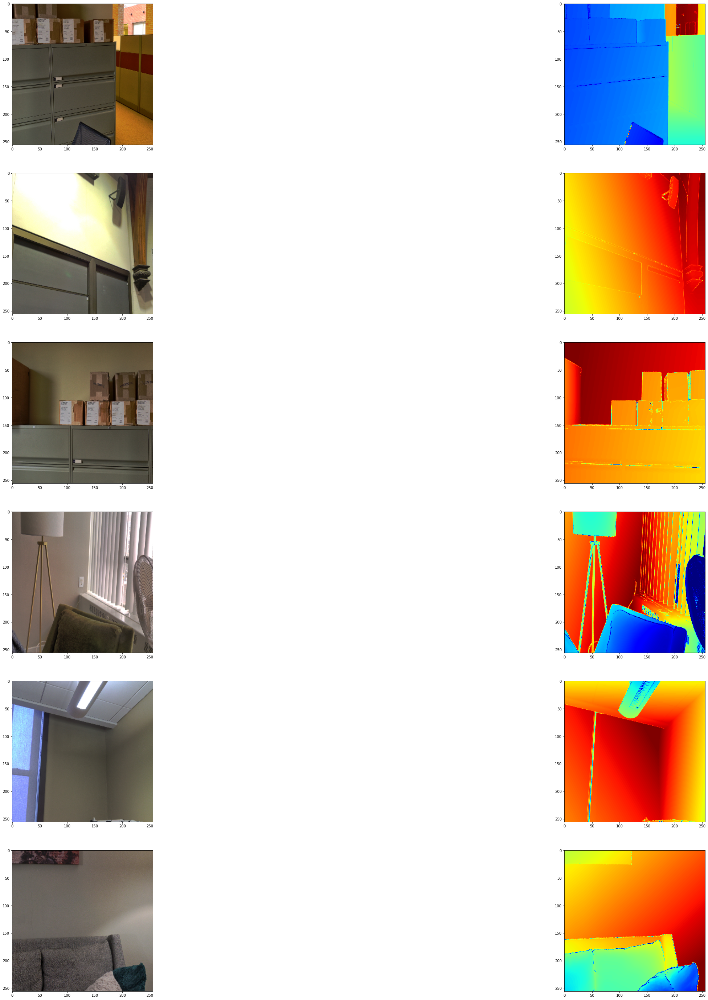

In [12]:
def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    target = rearrange(target, 'b c h w -> b h w c')
    cmap = copy.copy(plt.cm.jet)
    cmap.set_bad(color="black")

    if test:
        input = input.to(device)
        pred = model(input)
        input = rearrange(input, 'b c h w -> b h w c')
        pred = rearrange(pred, 'b c h w -> b h w c')
        input = input.detach().cpu()
        pred = pred.detach().cpu()
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)

    else:
        input = rearrange(input, 'b c h w -> b h w c')
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)


visualize_samples = next(iter(train_loader))
visualize_depth_map(visualize_samples)

## 3D point cloud visualization

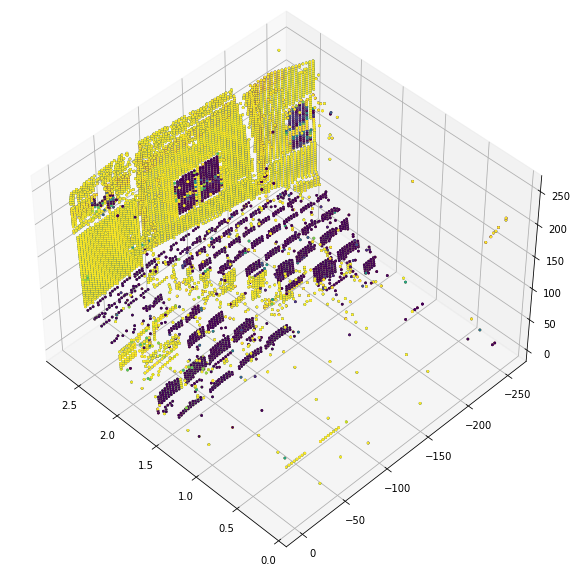

In [15]:
img_ind = 1

depth_vis = np.flipud(visualize_samples[1][img_ind].squeeze())  # target
img_vis = rearrange(visualize_samples[0][img_ind].squeeze(), 'c h w -> h w c')
img_vis = np.flipud(img_vis)  # input
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection="3d")
STEP = 3
for x in range(0, img_vis.shape[0], STEP):
    for y in range(0, img_vis.shape[1], STEP):
        ax.scatter(
            [depth_vis[x, y]] * 3,
            [y] * 3,
            [x] * 3,
            c=tuple(img_vis[x, y, :3] / 255),
            s=3,
        )
    ax.view_init(45, 135)

## Building the model

The basic model is from U-Net.

Addditive skip-connections are implemented in the downscaling block.

<img src='./images/unet.png' width='500'> 

In [13]:
class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

In [14]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)
        self.tanh = nn.Tanh()

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        logits = self.tanh(logits)
        return logits

In [15]:
model = UNet(n_channels=3, n_classes=1, bilinear=True).to(device)

In [18]:
visualize_samples = next(iter(train_loader))
summary(model, visualize_samples[0].shape)

Layer (type:depth-idx)                        Output Shape              Param #
UNet                                          --                        --
├─DoubleConv: 1-1                             [16, 64, 256, 256]        --
│    └─Sequential: 2-1                        [16, 64, 256, 256]        --
│    │    └─Conv2d: 3-1                       [16, 64, 256, 256]        1,792
│    │    └─BatchNorm2d: 3-2                  [16, 64, 256, 256]        128
│    │    └─ReLU: 3-3                         [16, 64, 256, 256]        --
│    │    └─Conv2d: 3-4                       [16, 64, 256, 256]        36,928
│    │    └─BatchNorm2d: 3-5                  [16, 64, 256, 256]        128
│    │    └─ReLU: 3-6                         [16, 64, 256, 256]        --
├─Down: 1-2                                   [16, 128, 128, 128]       --
│    └─Sequential: 2-2                        [16, 128, 128, 128]       --
│    │    └─MaxPool2d: 3-7                    [16, 64, 128, 128]        --
│    │    └

## Defining the loss

We will optimize 3 losses in our mode. 

1. Structural similarity index(SSIM). 
2. L1-loss, or Point-wise depth in our case. 
3. Depth smoothness loss.

Out of the three loss functions, SSIM contributes the most to improving model performance.

### SSIM (Structural Similarity Index Map)

- 수치적인 에러가 아닌 인간의 시각적 화질 차이 및 유사도를 평가하기 위해 고안된 방법
- 사람의 시각 시스템은 이미지의 구조 정보를 도출하는데 특화되어 있기 때문에 구조 정보의 왜곡 정도가 지각에 큰 영향을 미친다는 것이 SSIM의 핵심 가설
- 원본 이미지 A와 왜곡된 이미지 B가 있다고 할 때 SSIM은 두 이미지의 휘도, 대비, 및 구조를 비교

- 두 이미지간 평균 휘도 비교:
$$l(A,B)=\frac{2\mu_A\mu_B+C_1}{\mu_A^2+\mu_B^2+C_1}$$

- 이미지의 표준 편차 값을 이미지의 대비로 정의하고, 두 이미지의 표준편차 값을 비교:
$$c(A,B)=\frac{2\sigma_A\sigma_B+C_2}{\sigma_A^2+\sigma_B^2+C_2}$$

- 이미지의 구조는 이미지에서 평균 휘도를 뺀 후, 표준 편차로 나누어 정의:
$$\frac{A-\mu_A}{\sigma_A}, \frac{B-\mu_B}{\sigma_B}$$

- 이미지 구조 간의 상관계수를 구하는 것과 A와 B의 상관계수를 구하는 것이 동치라고 판단, A와 B의 상관계수를 구함으로써 이미지와 왜곡된 이미지 구조를 비교:
$$S(A,B)=\frac{\sigma_{AB}+C_3}{\sigma_A\sigma_B+C_3}$$

- 위에서 구한 3가지 항목을 묶은 것이 SSIM:
$$\begin{align*}
 SSIM(A,B)&=l(A,B)c(A,B)s(A,B) \\ 
 &= \frac{(2\mu_A\mu_B+C_1)(2\sigma_{AB}+C_2)}{(\mu_A^2+\mu_B^2+C_1)(\sigma_A^2+\sigma_B^2+C_2)}
\end{align*}$$

### Depth Smoothness loss

$$W_x = \text{exp}(-mean(abs(grad_{A_x})) \\ W_y = \text{exp}(-mean(abs(grad_{A_y}))$$
$$S_x = |grad_{B_x}*W_x| \\ S_y = |grad_{B_y}*W_y|$$
$$Depth Smoothness loss : mean(S_x)+mean(S_y)$$

In [18]:
class DepthEstimationLoss(nn.Module):
    def __init__(self, ssim_loss_weight=0.85, l1_loss_weight=0.1, edge_loss_weight=0.9):
        super(DepthEstimationLoss, self).__init__()
        self.ssim_loss_weight = ssim_loss_weight
        self.l1_loss_weight = l1_loss_weight
        self.edge_loss_weight = edge_loss_weight
        self.depth_smooth_loss_fn = depth_smooth.InverseDepthSmoothnessLoss()
        self.L1_loss_fn = nn.L1Loss()
    
    def forward(self, img1: torch.Tensor, img2: torch.Tensor) -> torch.Tensor:
        depth_smoothness_loss = self.depth_smooth_loss_fn(img1, img2)
        ssim_loss = ssim(img1, img2, window_size=7, reduction='mean', max_val=1)
        l1_loss = self.L1_loss_fn(img1, img2)
        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )
        
        return loss

In [21]:
optimizer = optim.AdamW(model.parameters(), lr=LR)
scheduler = optim.lr_scheduler.LambdaLR(optimizer=optimizer,
                                lr_lambda=lambda epoch: 0.95 ** epoch,
                                last_epoch=-1,
                                verbose=False)
loss_fn = DepthEstimationLoss().to(device)
# loss_fn = nn.L1Loss()

In [16]:
def train(model, train_data, optimizer, scheduler, loss_fn, use_fp16=True, max_norm=None):
    
    epoch_loss = 0
    
    model.train() 
    torch.autograd.set_detect_anomaly(True)
    for idx, [x, y] in enumerate(train_data):
        optimizer.zero_grad(set_to_none=True)
        scaler = torch.cuda.amp.GradScaler()
        
        input = x.to(device)
        target = y.to(device)
        
        with torch.cuda.amp.autocast(enabled=use_fp16):
            predictions = model(input)
            train_loss = loss_fn(predictions, target)
        if use_fp16:
            scaler.scale(train_loss).backward()
            if max_norm is not None:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm)
            scaler.step(optimizer)
            scaler.update()
        else:
            train_loss.backward()
            if max_norm is not None:
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm)
            optimizer.step()
        scheduler.step() 
        epoch_loss += train_loss.item()
        
    return epoch_loss

In [17]:
def validation(model, val_data, loss_fn):
    model.eval()
    val_loss = 0
    for idx, [x, y] in enumerate(val_data):
        input = x.to(device)
        target = y.to(device)
        with torch.no_grad():
            predictions = model.forward(input)
            val_loss += loss_fn(predictions, target)
        
    return val_loss.item()

In [24]:
%%time
history = dict()
best = {"loss": sys.float_info.max}

for epoch in range(1, EPOCHS+1):
    epoch_loss = train(model, train_loader, optimizer, scheduler, loss_fn, use_fp16=False, max_norm=5)
    val_loss = validation(model, valid_loader, loss_fn)
    
    history.setdefault('loss', []).append(epoch_loss) 
    history.setdefault('val_loss', []).append(val_loss) 
    
    print(f"[Train] Epoch : {epoch:^3}"\
        f"  Train Loss: {epoch_loss:.4}"\
        f"  Validation Loss: {val_loss:.4}")
    if epoch_loss < best["loss"]:
            best["state"] = model.state_dict()
            best["loss"] = val_loss
            best["epoch"] = epoch + 1

[Train] Epoch :  1   Train Loss: 6.648  Validation Loss: 1.609
[Train] Epoch :  2   Train Loss: 4.201  Validation Loss: 1.096
[Train] Epoch :  3   Train Loss: 3.815  Validation Loss: 0.973
[Train] Epoch :  4   Train Loss: 3.571  Validation Loss: 0.9958
[Train] Epoch :  5   Train Loss: 3.517  Validation Loss: 0.8709
[Train] Epoch :  6   Train Loss: 3.457  Validation Loss: 1.047
[Train] Epoch :  7   Train Loss: 3.5  Validation Loss: 1.755
[Train] Epoch :  8   Train Loss: 3.66  Validation Loss: 1.044
[Train] Epoch :  9   Train Loss: 3.797  Validation Loss: 1.61
[Train] Epoch : 10   Train Loss: 3.495  Validation Loss: 0.8965
[Train] Epoch : 11   Train Loss: 3.476  Validation Loss: 1.131
[Train] Epoch : 12   Train Loss: 3.508  Validation Loss: 0.8949
[Train] Epoch : 13   Train Loss: 3.482  Validation Loss: 1.054
[Train] Epoch : 14   Train Loss: 3.381  Validation Loss: 0.9844
[Train] Epoch : 15   Train Loss: 3.412  Validation Loss: 1.031
[Train] Epoch : 16   Train Loss: 3.448  Validation Los

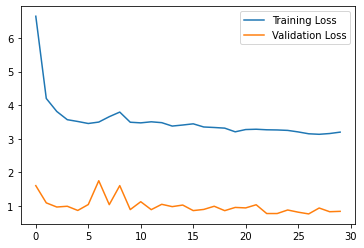

In [25]:
plt.plot(history["loss"], label="Training Loss")
plt.plot(history["val_loss"], label="Validation Loss")
plt.legend()
plt.show()

In [27]:
model.load_state_dict(best["state"])

<All keys matched successfully>

## Visualizaing model output

We visualize the model output over the validation set. The first image is the RGB image, the second image is the ground truth depth map image and the third one is the predicted depth map image.

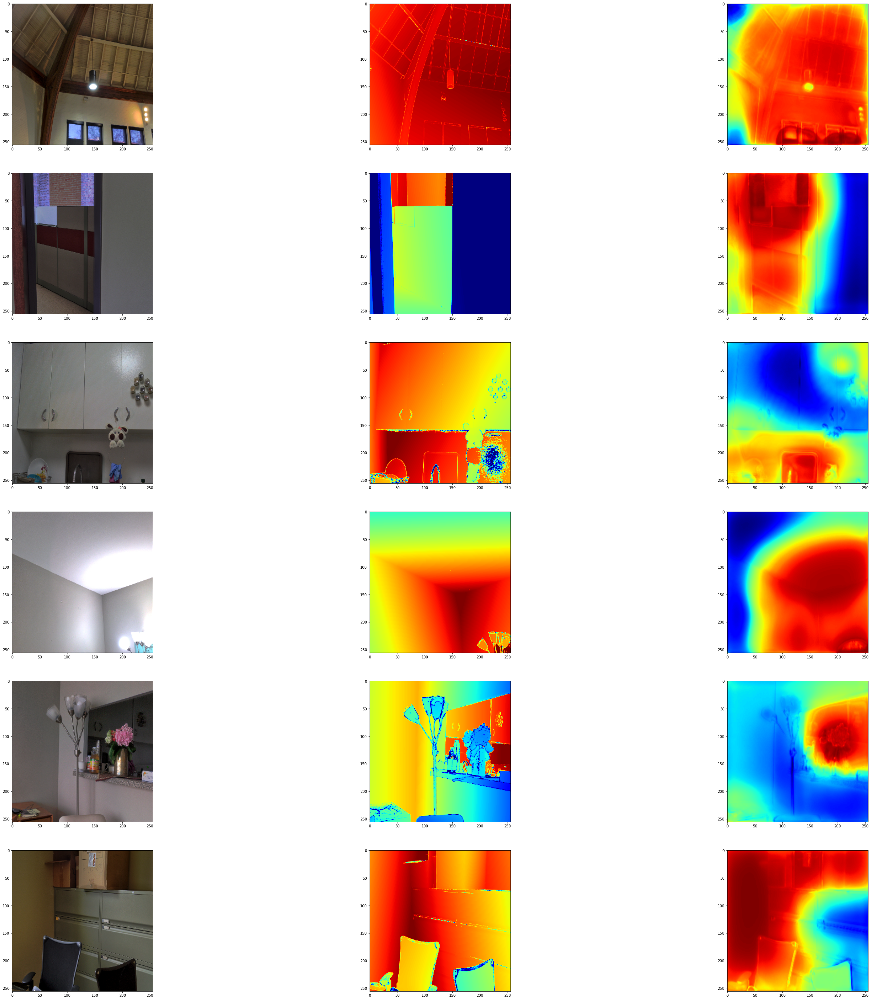

In [26]:
testdataset = CustomDataset(df[265:].reset_index(drop="true"))
testloader = DataLoader(dataset=traindataset, **params)

test_loader = next(iter(testloader))
visualize_depth_map(test_loader, test=True, model=model)

In [27]:
test_image1 = cv2.imread('./IMG_6933.JPG')
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = img_preprocess(test_image1)

In [28]:
cmap = copy.copy(plt.cm.jet)
cmap.set_bad(color="black")

test_image1 = torch.unsqueeze(test_image1, 0)
input = test_image1.to(device)
pred = model(input)
input = rearrange(input, 'b c h w -> b h w c')
pred = rearrange(pred, 'b c h w -> b h w c')
input = input.detach().cpu()
pred = pred.detach().cpu()

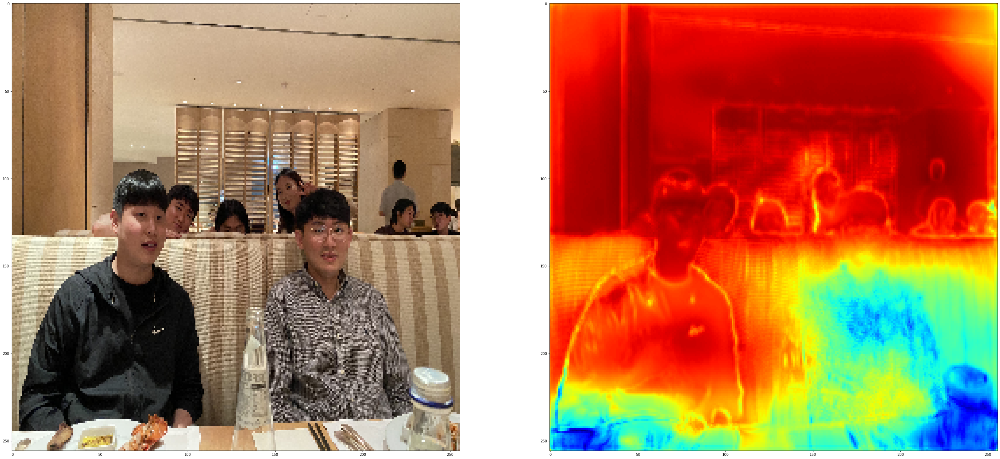

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(50, 50))
ax[0].imshow((input.squeeze()))
ax[1].imshow((pred.squeeze()), cmap=cmap)
plt.show()

In [30]:
test_image2 = cv2.imread('./IMG_7447.JPG')
test_image2 = cv2.cvtColor(test_image2, cv2.COLOR_BGR2RGB)
test_image2 = img_preprocess(test_image2)

In [31]:
cmap = copy.copy(plt.cm.jet)
cmap.set_bad(color="black")

test_image2 = torch.unsqueeze(test_image2, 0)
input = test_image2.to(device)
pred = model(input)
input = rearrange(input, 'b c h w -> b h w c')
pred = rearrange(pred, 'b c h w -> b h w c')
input = input.detach().cpu()
pred = pred.detach().cpu()

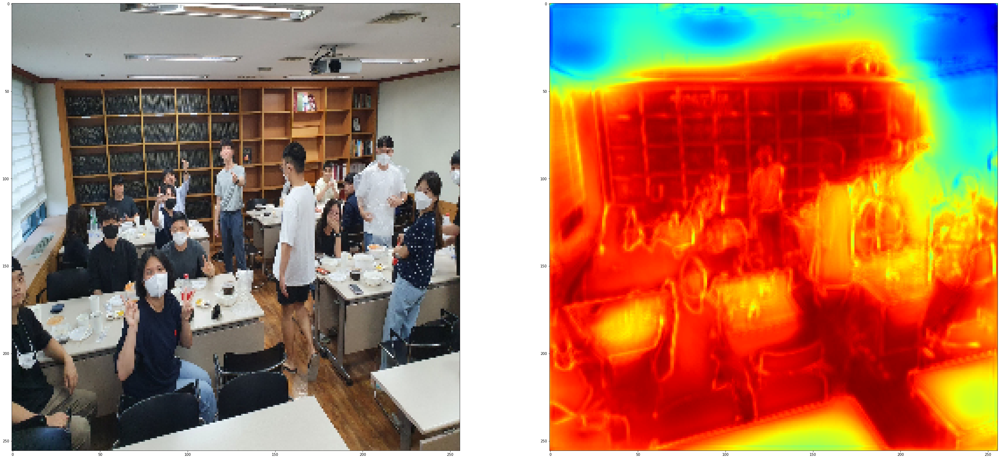

In [32]:
fig, ax = plt.subplots(1, 2, figsize=(50, 50))
ax[0].imshow((input.squeeze()))
ax[1].imshow((pred.squeeze()), cmap=cmap)
plt.show()

---

# use only L1 loss

In [17]:
model = UNet(n_channels=3, n_classes=1, bilinear=True).to(device)

In [18]:
optimizer = optim.AdamW(model.parameters(), lr=LR)
scheduler = optim.lr_scheduler.LambdaLR(optimizer=optimizer,
                                lr_lambda=lambda epoch: 0.95 ** epoch,
                                last_epoch=-1,
                                verbose=False)
loss_fn = nn.L1Loss()

In [19]:
%%time
history = dict()
best = {"loss": sys.float_info.max}

for epoch in range(1, EPOCHS+1):
    epoch_loss = train(model, train_loader, optimizer, scheduler, loss_fn, use_fp16=False, max_norm=5)
    val_loss = validation(model, valid_loader, loss_fn)
    
    history.setdefault('loss', []).append(epoch_loss) 
    history.setdefault('val_loss', []).append(val_loss) 
    
    print(f"[Train] Epoch : {epoch:^3}"\
        f"  Train Loss: {epoch_loss:.4}"\
        f"  Validation Loss: {val_loss:.4}")
    if epoch_loss < best["loss"]:
            best["state"] = model.state_dict()
            best["loss"] = val_loss
            best["epoch"] = epoch + 1

[Train] Epoch :  1   Train Loss: 12.13  Validation Loss: 4.002
[Train] Epoch :  2   Train Loss: 9.558  Validation Loss: 4.249
[Train] Epoch :  3   Train Loss: 9.175  Validation Loss: 2.751
[Train] Epoch :  4   Train Loss: 9.372  Validation Loss: 2.463
[Train] Epoch :  5   Train Loss: 9.294  Validation Loss: 3.758
[Train] Epoch :  6   Train Loss: 9.414  Validation Loss: 2.427
[Train] Epoch :  7   Train Loss: 9.383  Validation Loss: 2.599
[Train] Epoch :  8   Train Loss: 9.114  Validation Loss: 2.709
[Train] Epoch :  9   Train Loss: 9.375  Validation Loss: 2.309
[Train] Epoch : 10   Train Loss: 9.126  Validation Loss: 2.492
[Train] Epoch : 11   Train Loss: 9.35  Validation Loss: 2.75
[Train] Epoch : 12   Train Loss: nan  Validation Loss: 2.34
[Train] Epoch : 13   Train Loss: 9.416  Validation Loss: 3.292
[Train] Epoch : 14   Train Loss: 9.29  Validation Loss: 2.404
[Train] Epoch : 15   Train Loss: 9.508  Validation Loss: 3.293
[Train] Epoch : 16   Train Loss: 9.301  Validation Loss: 3.79

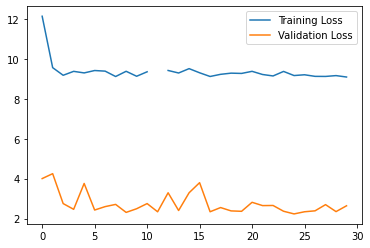

In [20]:
plt.plot(history["loss"], label="Training Loss")
plt.plot(history["val_loss"], label="Validation Loss")
plt.legend()
plt.show()

In [21]:
model.load_state_dict(best["state"])

<All keys matched successfully>

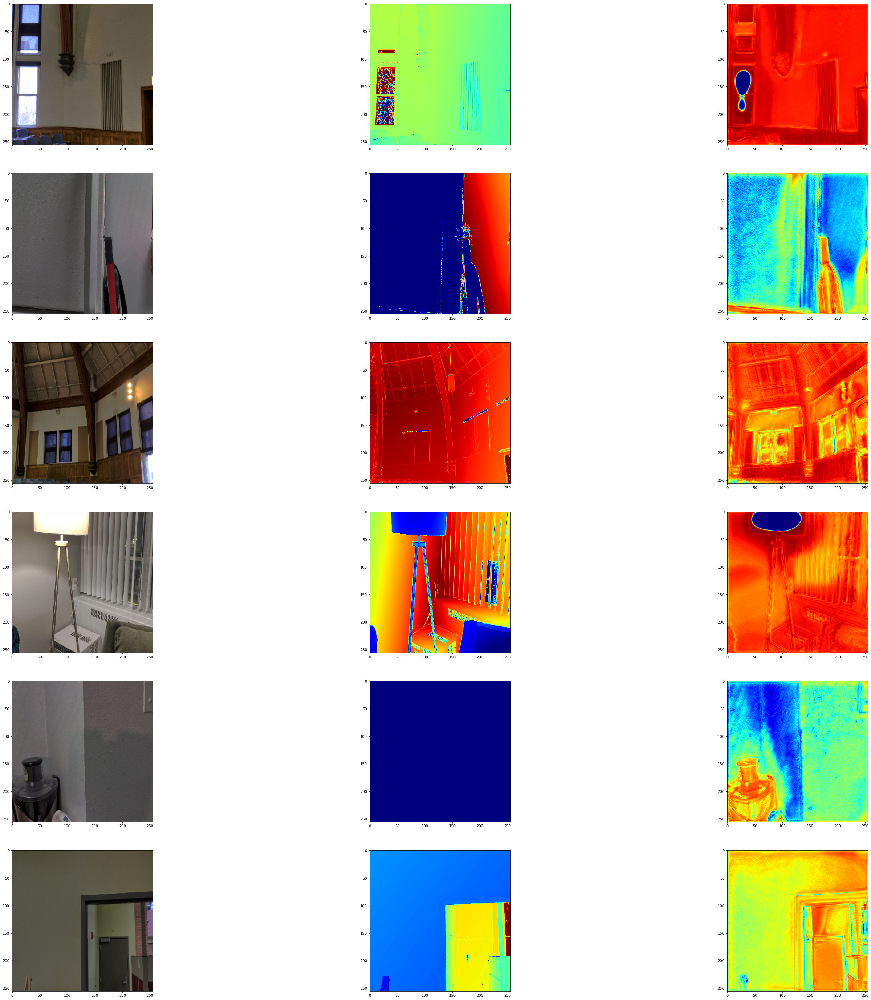

In [22]:
testdataset = CustomDataset(df[265:].reset_index(drop="true"))
testloader = DataLoader(dataset=traindataset, **params)

test_loader = next(iter(testloader))
visualize_depth_map(test_loader, test=True, model=model)

In [24]:
test_image1 = cv2.imread('./IMG_6933.JPG')
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = preprocess(test_image1)

In [25]:
test_image2 = cv2.imread('./IMG_7447.JPG')
test_image2 = cv2.cvtColor(test_image2, cv2.COLOR_BGR2RGB)
test_image2 = preprocess(test_image2)

In [26]:
cmap = copy.copy(plt.cm.jet)
cmap.set_bad(color="black")

test_image1 = torch.unsqueeze(test_image1, 0)
input = test_image1.to(device)
pred = model(input)
input = rearrange(input, 'b c h w -> b h w c')
pred = rearrange(pred, 'b c h w -> b h w c')
input = input.detach().cpu()
pred = pred.detach().cpu()

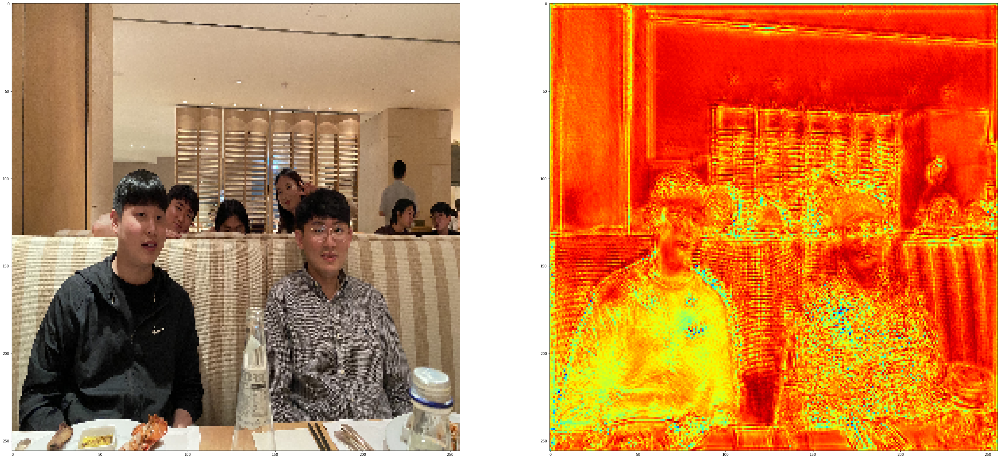

In [27]:
fig, ax = plt.subplots(1, 2, figsize=(50, 50))
ax[0].imshow((input.squeeze()))
ax[1].imshow((pred.squeeze()), cmap=cmap)
plt.show()

In [28]:
cmap = copy.copy(plt.cm.jet)
cmap.set_bad(color="black")

test_image2 = torch.unsqueeze(test_image2, 0)
input = test_image2.to(device)
pred = model(input)
input = rearrange(input, 'b c h w -> b h w c')
pred = rearrange(pred, 'b c h w -> b h w c')
input = input.detach().cpu()
pred = pred.detach().cpu()

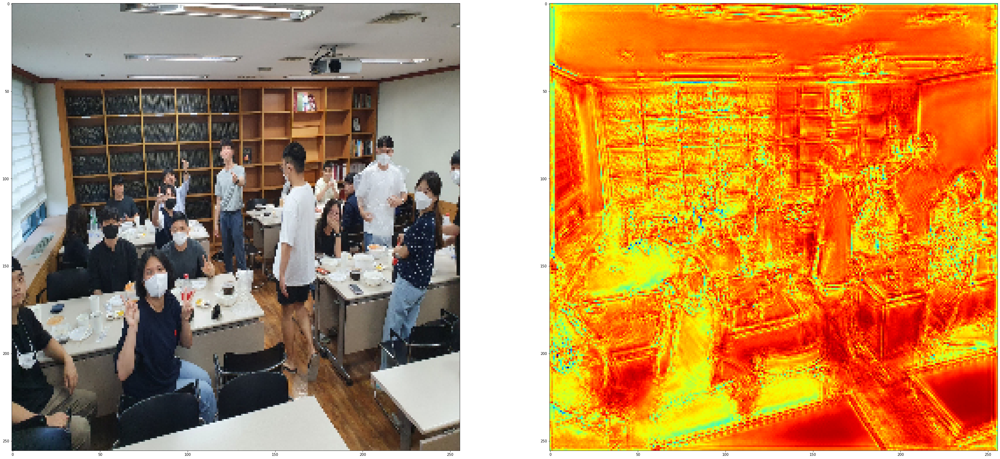

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(50, 50))
ax[0].imshow((input.squeeze()))
ax[1].imshow((pred.squeeze()), cmap=cmap)
plt.show()

---